In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (8, 4)
plt.rcParams['figure.dpi'] = 300
plt.show()

In [2]:
df = pd.read_csv('Cardiotocographic.csv')
df

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,120.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,73.0,0.5,43.000000,2.4,64.0,0.999926,2.000000
1,132.000000,0.006380,0.000000,0.006380,0.003190,0.0,0.0,17.0,2.1,0.000000,10.4,130.0,0.000000,1.000000
2,133.000000,0.003322,0.000000,0.008306,0.003322,0.0,0.0,16.0,2.1,0.000000,13.4,130.0,0.000000,1.000000
3,134.000000,0.002561,0.000000,0.007742,0.002561,0.0,0.0,16.0,2.4,0.000000,23.0,117.0,1.000000,1.000000
4,131.948232,0.006515,0.000000,0.008143,0.000000,0.0,0.0,16.0,2.4,0.000000,19.9,117.0,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121,140.000000,0.000000,0.961268,0.007426,0.000000,0.0,0.0,79.0,0.2,25.000000,7.2,40.0,0.000000,2.000000
2122,140.000000,0.000775,0.000000,0.006979,0.000000,0.0,0.0,78.0,0.4,22.000000,7.1,66.0,1.000000,2.000000
2123,140.000000,0.000980,0.000000,0.006863,0.000000,0.0,0.0,79.0,0.4,20.000000,6.1,67.0,1.000000,1.990464
2124,140.000000,0.000679,0.000000,0.006110,0.000000,0.0,0.0,78.0,0.4,27.000000,7.0,66.0,1.000000,2.000000


In [3]:
#1. Data Cleaning and Preparations

In [4]:
# checking dataset info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   LB        2105 non-null   float64
 1   AC        2106 non-null   float64
 2   FM        2126 non-null   float64
 3   UC        2126 non-null   float64
 4   DL        2126 non-null   float64
 5   DS        2105 non-null   float64
 6   DP        2105 non-null   float64
 7   ASTV      2126 non-null   float64
 8   MSTV      2126 non-null   float64
 9   ALTV      2126 non-null   float64
 10  MLTV      2105 non-null   float64
 11  Width     2105 non-null   float64
 12  Tendency  2105 non-null   float64
 13  NSP       2105 non-null   float64
dtypes: float64(14)
memory usage: 232.7 KB


In [5]:
# Data Type of all columns is float64
# Missing values are present in all the columns

In [6]:
# Describing dataset
df.describe().T

,count,mean,std,min,25%,50%,75%,max
LB,2105.0,133.343598,11.270154,51.842487,126.000000,133.000000,140.000000,214.000000
AC,2106.0,0.003219,0.004391,-0.019284,0.000000,0.001634,0.005650,0.038567
FM,2126.0,0.009894,0.067540,-0.480634,0.000000,0.000000,0.002567,0.961268
UC,2126.0,0.004391,0.003340,-0.014925,0.001851,0.004484,0.006536,0.030002
DL,2126.0,0.001895,0.003343,-0.015393,0.000000,0.000000,0.003289,0.030769
DS,2105.0,0.000003,0.000142,-0.001353,0.000000,0.000000,0.000000,0.002706
DP,2105.0,0.000175,0.000840,-0.005348,0.000000,0.000000,0.000000,0.010695
ASTV,2126.0,46.995984,18.813973,-63.000000,32.000000,49.000000,61.000000,162.000000
MSTV,2126.0,1.364378,1.173632,-6.600000,0.700000,1.200000,1.700000,13.800000
ALTV,2126.0,10.285964,21.205041,-91.000000,0.000000,0.000000,11.000000,182.000000


In [7]:
# Outliers may be present
# Missing / null values are present

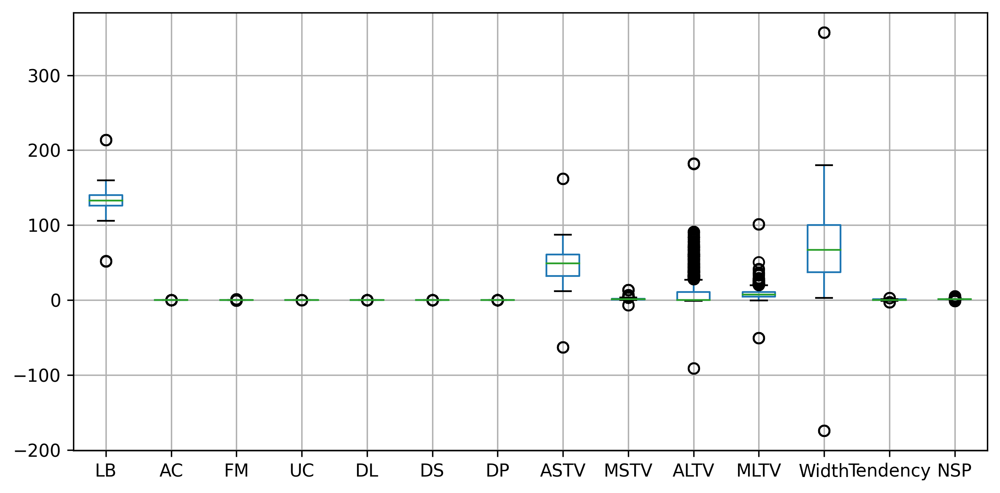

In [8]:
# Checking for outliers 
df.boxplot()
plt.tight_layout()

In [9]:
# Almost every column is having outliers

In [10]:
# Checking for missing values
df.isna().sum()

LB          21
AC          20
FM           0
UC           0
DL           0
DS          21
DP          21
ASTV         0
MSTV         0
ALTV         0
MLTV        21
Width       21
Tendency    21
NSP         21
dtype: int64

In [11]:
# Missing values are present in some columns
# Imputing missing values.
# Replacing missing values with median values due to presence of outliers in columns.

In [12]:
df.fillna(df.median(), inplace = True)
df.isna().sum()

LB          0
AC          0
FM          0
UC          0
DL          0
DS          0
DP          0
ASTV        0
MSTV        0
ALTV        0
MLTV        0
Width       0
Tendency    0
NSP         0
dtype: int64

In [13]:
df[df['LB'].isna()]

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   LB        2126 non-null   float64
 1   AC        2126 non-null   float64
 2   FM        2126 non-null   float64
 3   UC        2126 non-null   float64
 4   DL        2126 non-null   float64
 5   DS        2126 non-null   float64
 6   DP        2126 non-null   float64
 7   ASTV      2126 non-null   float64
 8   MSTV      2126 non-null   float64
 9   ALTV      2126 non-null   float64
 10  MLTV      2126 non-null   float64
 11  Width     2126 non-null   float64
 12  Tendency  2126 non-null   float64
 13  NSP       2126 non-null   float64
dtypes: float64(14)
memory usage: 232.7 KB


In [15]:
# Missing values are replaced by median values.

In [16]:
# Checking for duplicated records
df.duplicated().value_counts()

False    2124
True        2
dtype: int64

In [17]:
# Removing diplicated records
df.drop_duplicates(inplace = True)
df.duplicated().value_counts()

False    2124
dtype: int64

In [18]:
# Duplicated records are dropped (removed).

In [19]:
# Treating outliers using capping method.
# Creating a function for getting upper and lower extreme values of column
def outlier_detection(data, colname):
    q1 = data[colname].quantile(0.25)
    q3 = data[colname].quantile(0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    return lower, upper

In [20]:
# Checking upper and lower extreme values of columns and replacing outlier values using capping.
outlier_detection(data = df, colname = 'LB')

(105.0, 161.0)

In [21]:
# detecting outliers in 'LB' column.
df[(df['LB'] < 105.0) | (df['LB'] > 161.0)]

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
134,52.000000,0.001590,0.000000,0.029851,0.000000,0.000000,0.000003,58.000000,0.500000,0.0,7.9,44.00000,1.0,1.0000
411,214.000000,0.000000,0.000000,0.001595,0.001595,0.000000,0.000000,71.000000,0.300000,17.0,5.8,15.00000,0.0,2.0000
610,214.000000,0.002469,0.002469,0.002469,0.000000,0.000004,0.000000,35.000000,1.798149,0.0,24.7,118.00000,1.0,1.0000
612,214.000000,0.005181,0.012953,0.002591,0.000000,0.000000,0.000000,39.442226,1.600000,0.0,10.0,136.00000,0.0,0.9912
785,52.000000,0.000834,0.013344,0.000000,0.000000,0.000000,0.000000,53.000000,0.700000,8.0,12.0,77.00000,1.0,1.0000
1027,51.842487,0.009485,0.000000,0.005420,0.002710,0.000005,0.000000,-63.000000,2.500000,0.0,3.9,98.00000,0.0,1.0000
1103,214.000000,0.006972,0.000000,0.002960,0.000000,0.000000,0.000000,19.000000,2.300000,0.0,12.1,53.00000,0.0,1.0000
1406,214.000000,0.005068,0.000000,0.001689,0.000000,0.000000,0.000000,46.000000,0.800000,0.0,8.6,67.00000,1.0,1.0000
1504,214.000000,0.006189,0.000000,0.006189,0.000000,0.000000,0.000000,38.000000,1.000000,0.0,8.1,53.00000,0.0,1.0000
1834,52.188547,0.000000,0.001043,0.003128,0.007299,0.000000,0.000000,61.000000,1.400000,0.0,10.0,105.40169,1.0,1.0000


In [22]:
# Replacing values < 105.0 to 105.0 & values > 161.0 to 161.0
df['LB'] = df['LB'].mask(df['LB'] < 105.0, 105.0).mask(df['LB'] > 161.0, 161.0)
df['LB'].min(), df['LB'].max()

(105.0, 161.0)

Text(0.5, 1.0, 'Boxplot of LB')

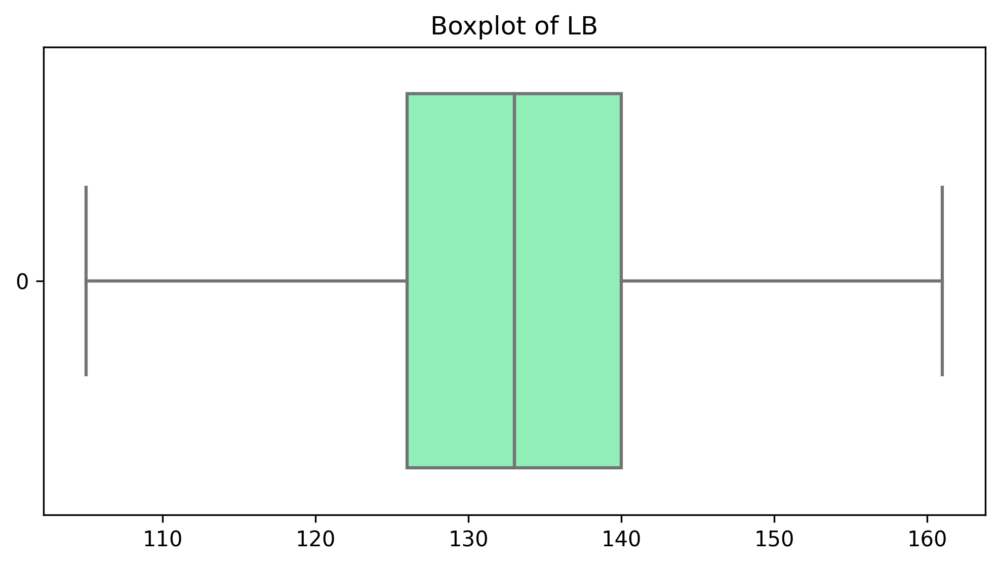

In [23]:
# Checking whether outliers are removed or not
sns.boxplot(df['LB'], orient='h', palette= 'rainbow')
plt.title('Boxplot of LB')

In [24]:
# Now outliers from LB column is replaced using capping.
# Applying capping method to all columns for replacement of outliers.
# We need to replace outlier values of all the remaining columns.
# So instead of writing same code again n again creating a function to replace outlier values.
def replace_outliers(data, colname):
    lower, upper = outlier_detection(data, colname)
    data[colname] = data[colname].mask(data[colname] < lower, lower)
    data[colname] = data[colname].mask(data[colname] > upper, upper)

In [25]:
# Running a for loop for replacement of outliers
for column in df.columns[1:]:
    replace_outliers(df, column)

print('Done!')

Done!


In [26]:
# Replacement ot outlier vlaues using Capping has been done.

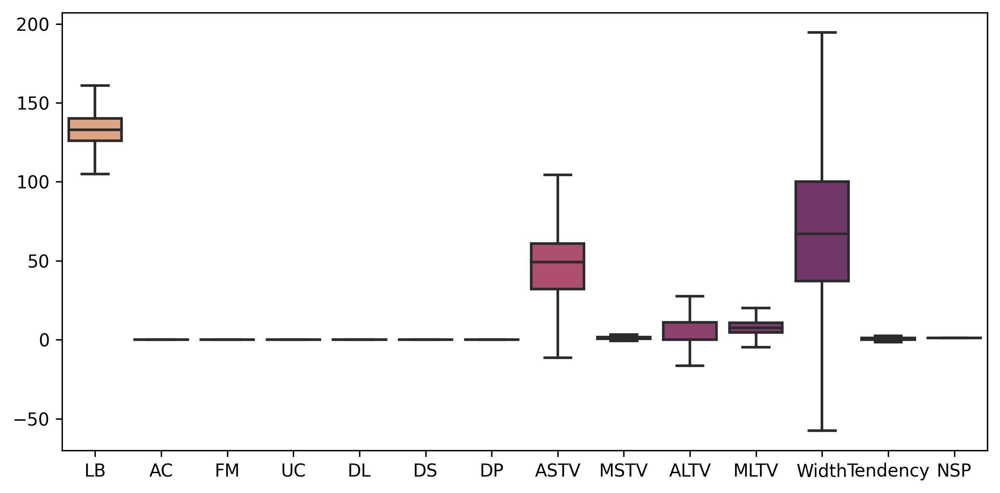

In [27]:
# Checking for outliers by plotting boxplot.
sns.boxplot(data = df, palette='flare')
plt.tight_layout()

In [28]:
# We can see that the all the columns are now free from outliers.

In [29]:
# 2. Statistical Summary

In [30]:
# Calculating Measure of central Tendency (Mean, Median) of all variables (Columns)
for column in df.columns[:]:
    print(f'{column} => Mean = {df[column].mean()} , Median = {df[column].median()}')

LB => Mean = 133.2887210469459 , Median = 133.0
AC => Mean = 0.0031331727445588035 , Median = 0.001633991
FM => Mean = 0.0015700097762862035 , Median = 0.0
UC => Mean = 0.00436470300972252 , Median = 0.0044863175
DL => Mean = 0.0017724816850668696 , Median = 0.0
DS => Mean = 0.0 , Median = 0.0
DP => Mean = 0.0 , Median = 0.0
ASTV => Mean = 46.998334422525865 , Median = 49.0
MSTV => Mean = 1.3045544188400768 , Median = 1.2
ALTV => Mean = 6.697979436424518 , Median = 0.0
MLTV => Mean = 8.002911585795323 , Median = 7.4
Width => Mean = 70.31854677030172 , Median = 67.0
Tendency => Mean = 0.3168352725474909 , Median = 0.0
NSP => Mean = 1.0 , Median = 1.0


In [31]:
# Calculating Measure of Dispersion (standard deviation, inter-quartile range) for all variables.
for column in df.columns[:]:
    print(f'{column} => Standard dev. = {df[column].std()}, iqr = {df[column].quantile(0.75) - df[column].quantile(0.25)}')

LB => Standard dev. = 9.926789821153358, iqr = 14.0
AC => Standard dev. = 0.003830253338936582, iqr = 0.005612068
FM => Standard dev. = 0.00248691630355548, iqr = 0.00256842175
UC => Standard dev. = 0.0030005019133721284, iqr = 0.00467761975
DL => Standard dev. = 0.002670114166423484, iqr = 0.003292188
DS => Standard dev. = 0.0, iqr = 0.0
DP => Standard dev. = 0.0, iqr = 0.0
ASTV => Standard dev. = 17.60991136194615, iqr = 29.0
MSTV => Standard dev. = 0.7813030899664531, iqr = 1.0
ALTV => Standard dev. = 10.381253926419243, iqr = 11.0
MLTV => Standard dev. = 5.046792194091929, iqr = 6.200000000000001
Width => Standard dev. = 39.577384816794556, iqr = 63.0
Tendency => Standard dev. = 0.6226233087974882, iqr = 1.0
NSP => Standard dev. = 0.0, iqr = 0.0


In [32]:
#3. Data Visualizations

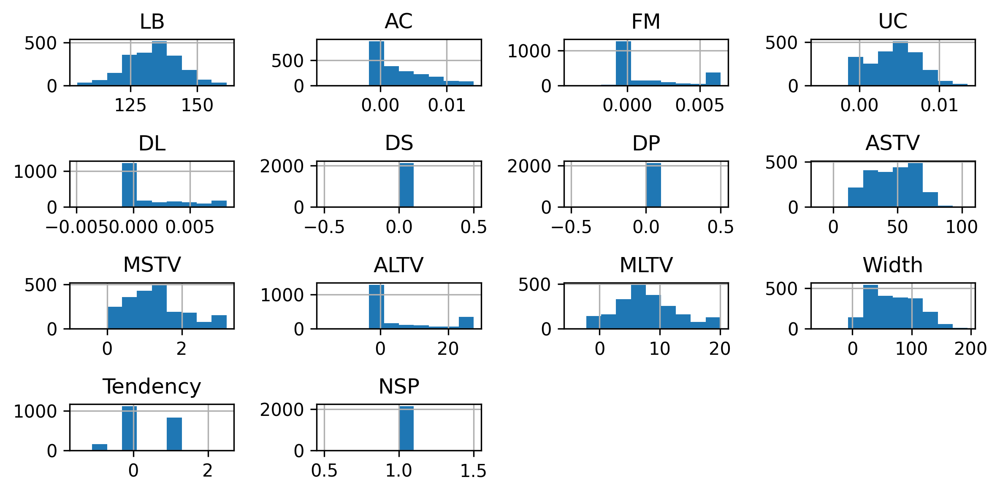

In [33]:
# Checking for data distributions.
df.hist()
plt.tight_layout()

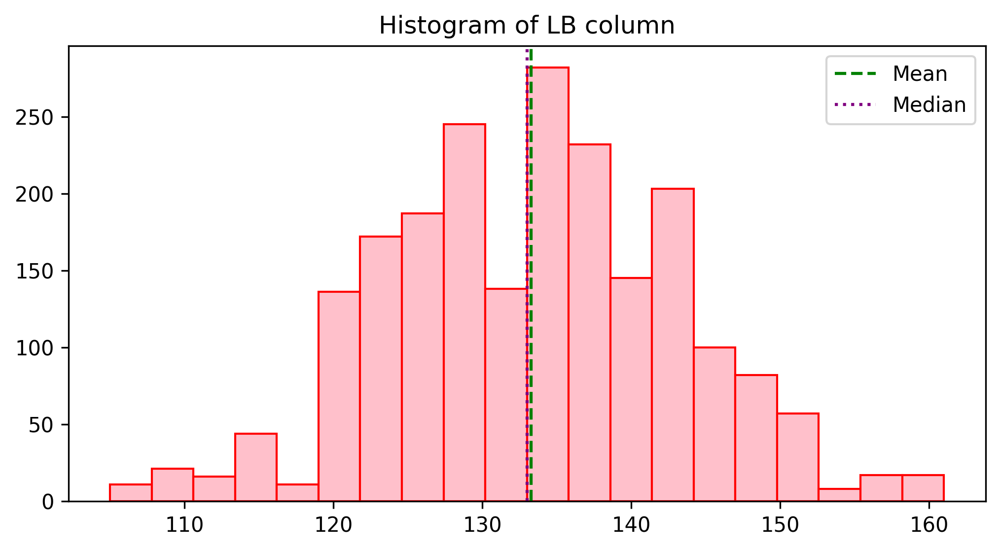

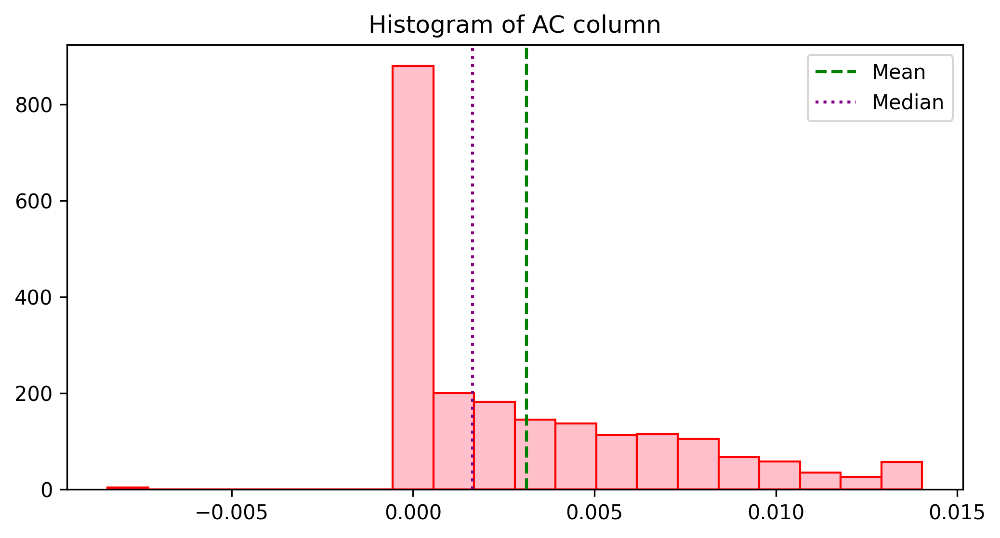

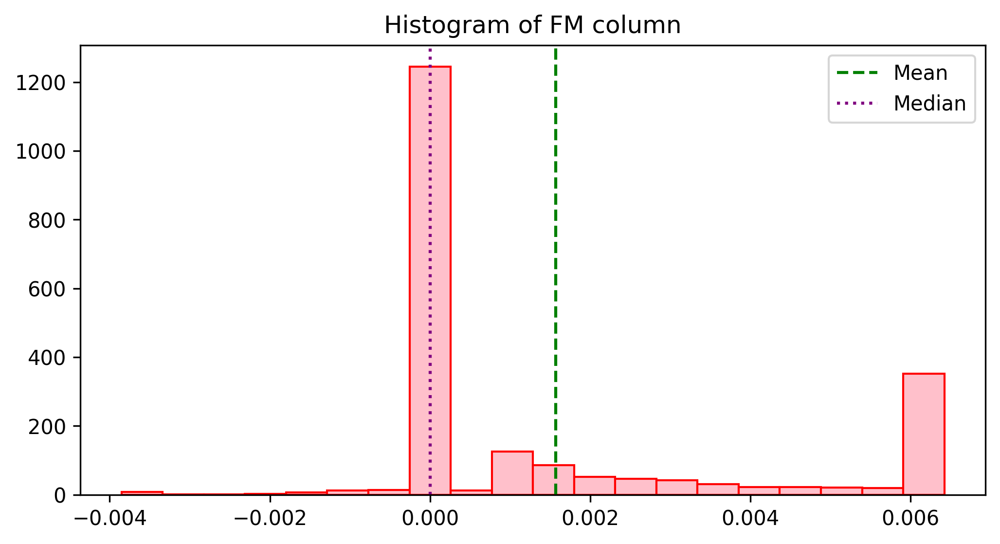

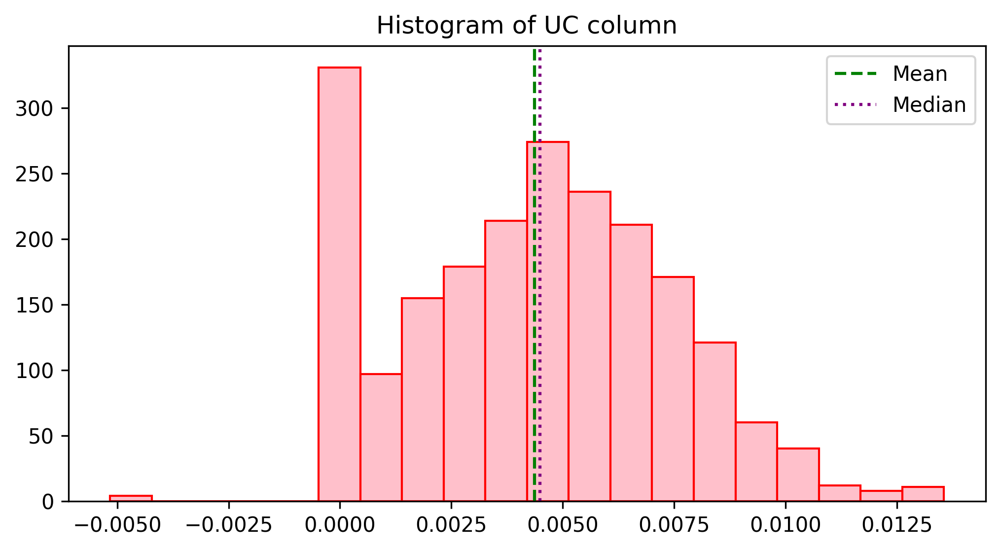

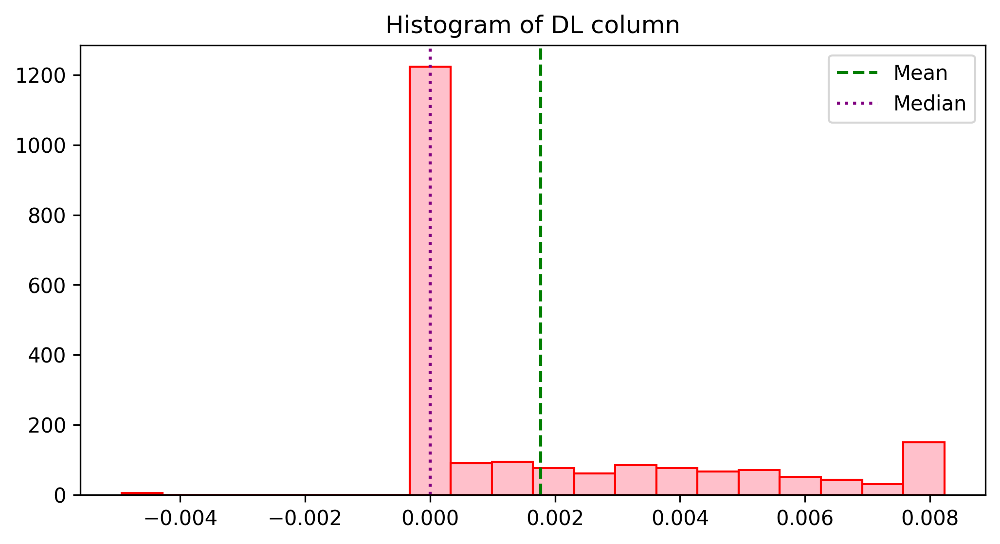

...

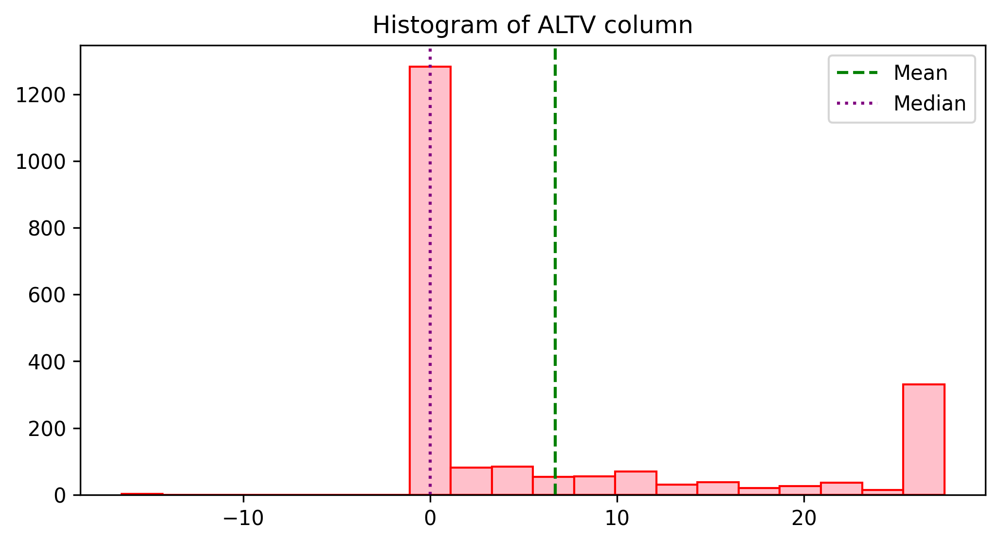

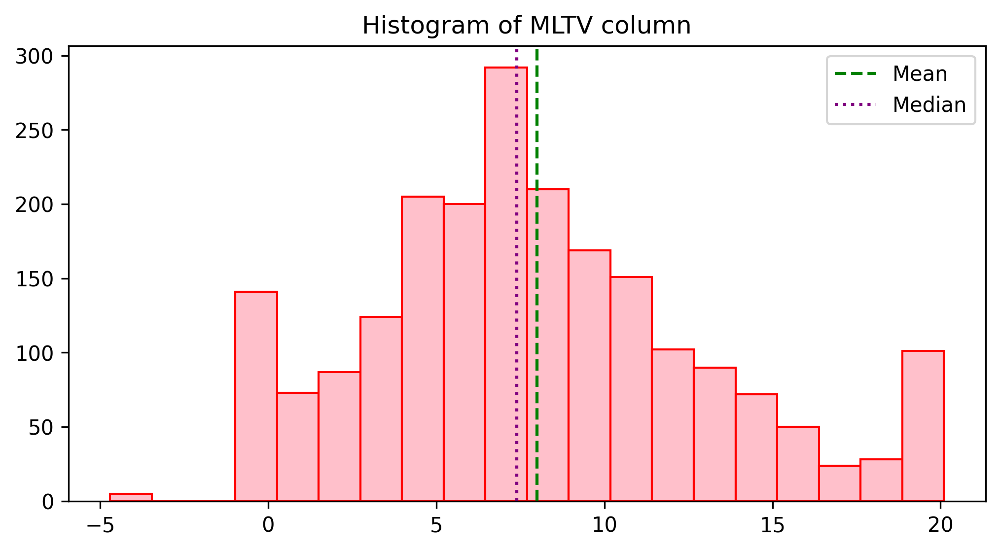

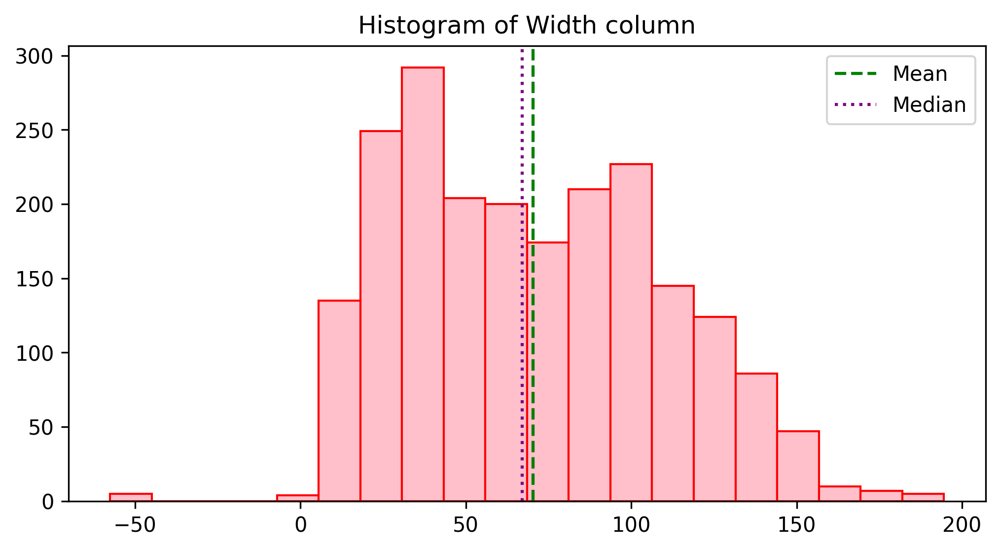

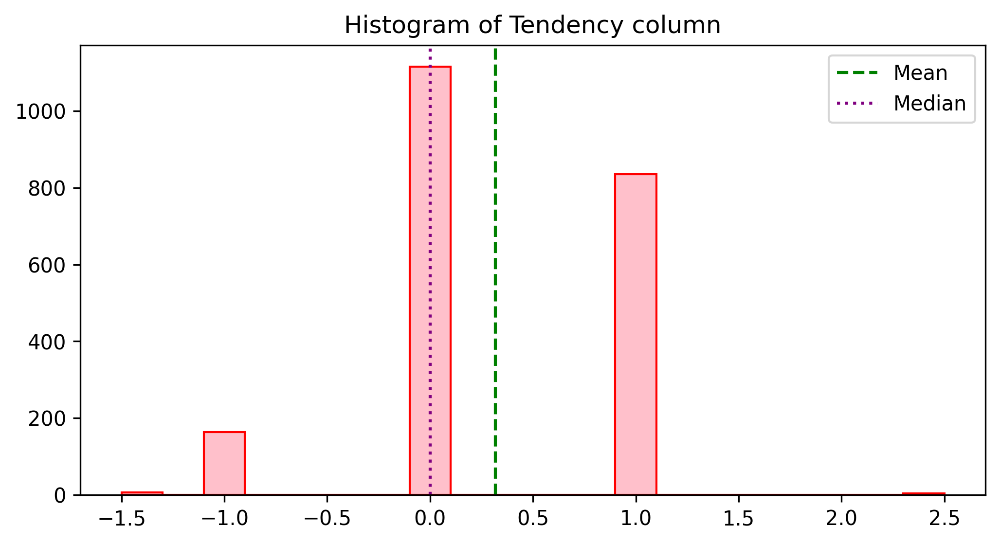

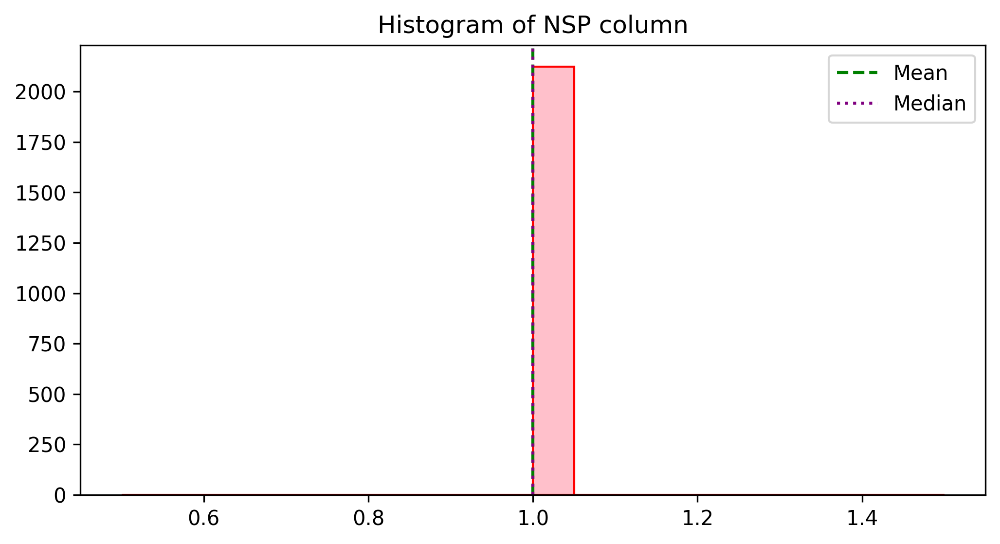

In [34]:
for column in df.columns:
    plt.hist(df[column], bins=20, color='pink', edgecolor='red')
    plt.axvline(df[column].mean(), color='green', linestyle='dashed', label='Mean')
    plt.axvline(df[column].median(), color='purple', linestyle='dotted', label='Median')
    plt.title(f'Histogram of {column} column')
    plt.legend()
    plt.show()

In [35]:
# We can seee that some of colums is having normally distributed data but some of them is not normally distributed.

In [36]:
df.head()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,120.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,73.0,0.5,27.5,2.4,64.0,0.999926,1.0
1,132.000000,0.006380,0.0,0.006380,0.003190,0.0,0.0,17.0,2.1,0.0,10.4,130.0,0.000000,1.0
2,133.000000,0.003322,0.0,0.008306,0.003322,0.0,0.0,16.0,2.1,0.0,13.4,130.0,0.000000,1.0
3,134.000000,0.002561,0.0,0.007742,0.002561,0.0,0.0,16.0,2.4,0.0,20.1,117.0,1.000000,1.0
4,131.948232,0.006515,0.0,0.008143,0.000000,0.0,0.0,16.0,2.4,0.0,19.9,117.0,1.000000,1.0


In [37]:
# There is no categoircal column to plot frequency of catefories using bar chart or pie chart.

In [38]:
# Visualizing correlation between variables
df.corr()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
LB,1.000000,-0.081548,-0.006840,-0.163345,-0.156314,NaN,NaN,0.285464,-0.295132,0.322864,-0.042241,-0.139978,0.281144,NaN
AC,-0.081548,1.000000,0.075611,0.093222,-0.103258,NaN,NaN,-0.273189,0.216861,-0.408246,-0.151713,0.283750,0.030489,NaN
FM,-0.006840,0.075611,1.000000,-0.318156,-0.018024,NaN,NaN,0.155798,0.070412,-0.013820,-0.036439,0.164178,0.000302,NaN
UC,-0.163345,0.093222,-0.318156,1.000000,0.268151,NaN,NaN,-0.217484,0.298462,-0.294226,-0.073152,0.131010,-0.074729,NaN
DL,-0.156314,-0.103258,-0.018024,0.268151,1.000000,NaN,NaN,-0.112289,0.566625,-0.296383,-0.242345,0.514238,0.014025,NaN
DS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ASTV,0.285464,-0.273189,0.155798,-0.217484,-0.112289,NaN,NaN,1.000000,-0.433731,0.438800,-0.323930,-0.242111,-0.010237,NaN
MSTV,-0.295132,0.216861,0.070412,0.298462,0.566625,NaN,NaN,-0.433731,1.000000,-0.541296,0.010734,0.646155,-0.064696,NaN
ALTV,0.322864,-0.408246,-0.013820,-0.294226,-0.296383,NaN,NaN,0.438800,-0.541296,1.000000,-0.132584,-0.439604,0.052204,NaN


<Axes: >

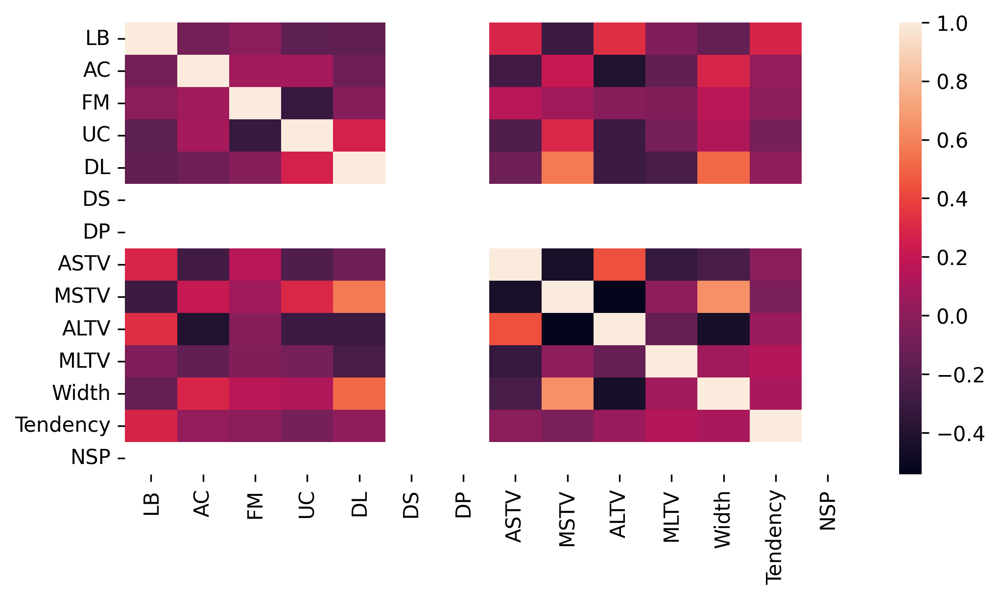

In [39]:
sns.heatmap(df.corr())

In [40]:
sns.pairplot(df)

In [41]:
#4. Pattern recognitation and Insights.
#5. Conclusion.